# **10x Visium colon metabolic zonation analysis on the unrolled space**

This notebook reproduces the figures present in Fig 4, Fig S7, as well as the bottom part of Fig S8A.

In [1]:
import harreman
import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import seaborn as sns
import matplotlib.pyplot as plt
import mplscience
from scipy.stats import mannwhitneyu, zscore
from statsmodels.stats.multitest import multipletests
from plotnine import *
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.utils import resample
import warnings
warnings.filterwarnings("ignore")


BASE_PATH = "/home/projects/nyosef/oier/Harreman_files/Visium_colon"
ADATA_PATH = os.path.join(BASE_PATH, 'h5ads')
DATA_PATH = os.path.join(BASE_PATH, 'data')
PLOTS_PATH = os.path.join(BASE_PATH, 'plots')
VISIUM_COLON_DESTVI_ADATA_PATH = os.path.join(ADATA_PATH, 'Visium_colon_DestVI_v2_adata.h5ad')

## Functions

In [2]:
def polynomial_regression(adata, cond, super_modules, fraction_df, var, xlabel, y_min, y_max, degree = 3, figsize=(8, 6)):

    X = adata.obs[var].dropna().values.reshape(-1, 1)
    X_high_res = np.linspace(X.min(), X.max(), 500).reshape(-1, 1)

    plt.figure(figsize=figsize)
    
    mods_cond = fraction_df[fraction_df['cond'] == cond]['top_super_module'].tolist()
    
    p_values_uniform = []
    p_values_perm = []
    
    for mod in super_modules:
        
        if mod not in mods_cond:
            continue
        
        y = zscore(adata.obs[mod].loc[adata.obs[var].dropna().index].values)

        # Fit polynomial regression
        poly = PolynomialFeatures(degree=degree)
        X_poly = poly.fit_transform(X)

        model = LinearRegression()
        model.fit(X_poly, y)
        
        # Predict mean
        X_high_res_poly = poly.transform(X_high_res)
        y_pred = model.predict(X_high_res_poly)

        # Bootstrap resampling for confidence intervals
        n_bootstrap = 1000
        bootstrap_preds = []

        for _ in range(n_bootstrap):
            X_sample, y_sample = resample(X, y)
            X_sample_poly = poly.fit_transform(X_sample)
            bootstrap_model = LinearRegression()
            bootstrap_model.fit(X_sample_poly, y_sample)
            bootstrap_preds.append(bootstrap_model.predict(X_high_res_poly))

        bootstrap_preds = np.array(bootstrap_preds)

        # Calculate 95% confidence intervals
        lower_bound = np.percentile(bootstrap_preds, 2.5, axis=0)
        upper_bound = np.percentile(bootstrap_preds, 97.5, axis=0)

        # Plot mean prediction and confidence interval
        line_width_factor = fraction_df[(fraction_df['cond'] == cond) & (fraction_df['top_super_module'] == mod)]['Fraction'].tolist()[0]
        plt.plot(X_high_res, y_pred, label=f'{mod} (Mean)', linewidth=8*line_width_factor)
        plt.fill_between(X_high_res.flatten(), lower_bound, upper_bound, alpha=0.2, label=f'{mod} (95% CI)')
        # plt.fill_between(X_high_res.flatten(), lower_bound, upper_bound, alpha=0.8, label=f'{mod} (95% CI)')
        plt.ylim(y_min, y_max)
    
    # Customize plot
    plt.xlabel(xlabel)
    plt.ylabel('Z-scored module score')
    plt.title(cond)
    
    return

## Load dataset

Load the AnnData file and create the Hotspot object.

In [3]:
adata = ad.read_h5ad(os.path.join(ADATA_PATH, 'Visium_colon_unrolled_adata.h5ad'))

Filter out genes expressed in less than 50 spots per sample

In [4]:
sample_col = 'cond'
n_genes_expr = 50
genes_to_keep = np.zeros(adata.shape[1], dtype=bool)

for sample in adata.obs[sample_col].unique():
    adata_sample = adata[adata.obs[sample_col] == sample]
    expressed = np.array((adata_sample.X > 0).sum(axis=0)).flatten()
    genes_to_keep |= expressed >= n_genes_expr

adata = adata[:, genes_to_keep].copy()

Average distance to the 5 nearest neighbors

In [5]:
coords = adata.obsm['spatial']

In [6]:
nbrs = NearestNeighbors(
    n_neighbors=5,
    algorithm='ball_tree').fit(adata.obsm['spatial_unrolled'])
dist, ind = nbrs.kneighbors()

In [7]:
def calculate_average_distance(neighbors, coordinates):
    n_cells = neighbors.shape[0]
    avg_distances = np.zeros(n_cells)
    for i in range(n_cells):
        neighbor_indices = neighbors[i]
        cell_coord = coordinates[i]
        neighbor_coords = coordinates[neighbor_indices]
        distances = np.linalg.norm(neighbor_coords - cell_coord, axis=1)
        avg_distances[i] = np.mean(distances)
    
    return avg_distances

In [8]:
avg_distances = calculate_average_distance(ind, coords)

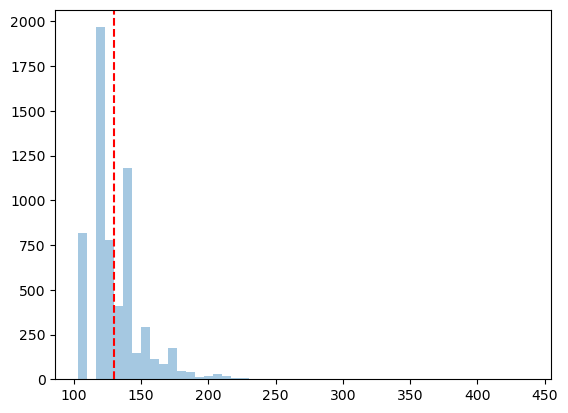

In [9]:
sns.distplot(avg_distances, bins=50, kde=False)
plt.axvline(np.mean(avg_distances), color='red', linestyle='--')
# plt.savefig(os.path.join(PLOTS_PATH, 'neighbors_avg_distance_plot.svg'))

## Perform the analysis

In [10]:
harreman.tl.compute_knn_graph(adata, 
                           compute_neighbors_on_key="spatial_unrolled", 
                           n_neighbors=5,
                           weighted_graph=False,
                           sample_key='cond',
                           verbose=True)

Computing the neighborhood graph...
Restricting graph within samples using 'cond'...


100%|██████████| 2/2 [00:00<00:00, 124.56it/s]

Computing the weights...
Finished computing the KNN graph in 2.833 seconds


In [11]:
harreman.hs.compute_local_autocorrelation(adata, layer_key="counts", model='danb', species='mouse', use_metabolic_genes=True, verbose=True)

Computing local autocorrelation...
Local autocorrelation results are stored in adata.uns['gene_autocorrelation_results']
Finished computing local autocorrelation in 1.081 seconds


We only use those genes with a significant autocorrelation (FDR < 0.01) for the subsequent analysis.

In [12]:
gene_autocorrelation_results = adata.uns['gene_autocorrelation_results']
genes = gene_autocorrelation_results.loc[gene_autocorrelation_results.Z_FDR < 0.01].sort_values('Z', ascending=False).index

In [13]:
harreman.hs.compute_local_correlation(adata, genes=genes, verbose=True)

Computing pair-wise local correlation on 759 features...
Pair-wise local correlation results are stored in adata.uns with the following keys: ['lcs', 'lc_zs', 'lc_z_pvals', 'lc_z_FDR']
Finished computing pair-wise local correlation in 0.468 seconds


In [14]:
harreman.hs.create_modules(adata, min_gene_threshold=20)

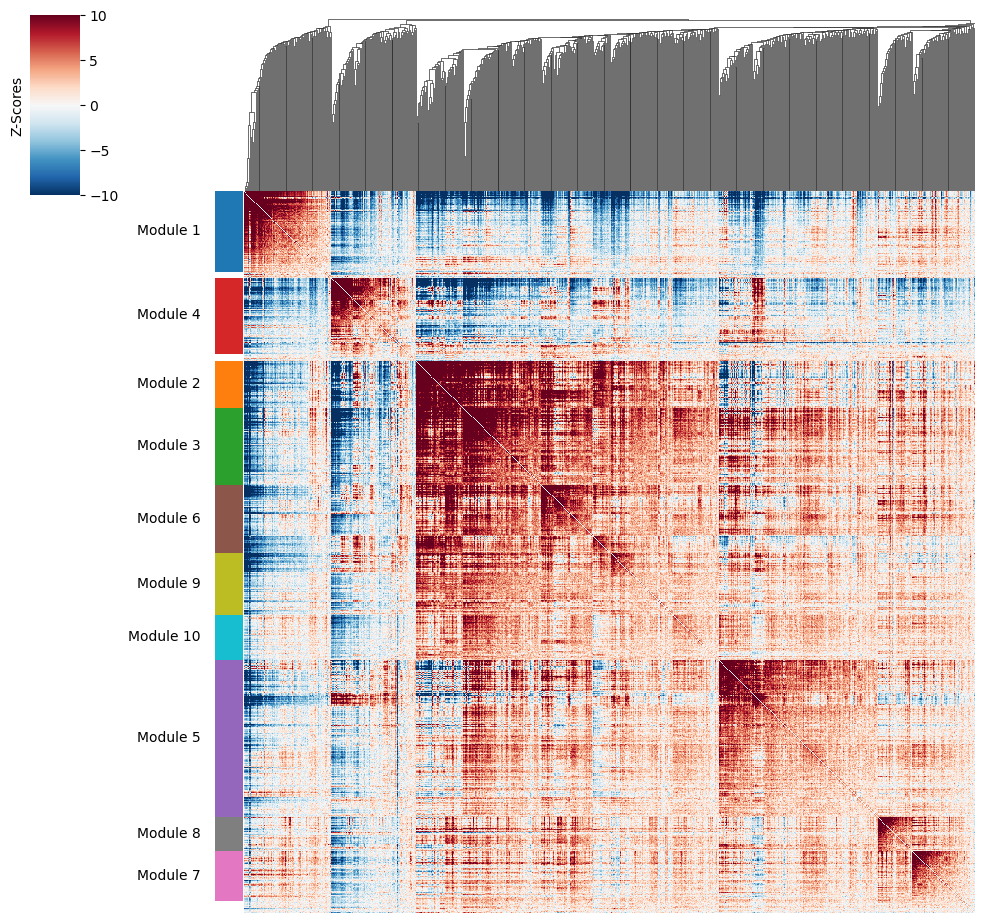

In [15]:
harreman.pl.local_correlation_plot(adata)

The function below computes the average local correlation Z to visualize modules that have high correlation between them.

In [16]:
super_module_dict = {
    1: [1],
    2: [2, 3],
    3: [4],
    4: [5],
    5: [6, 9, 10],
    6: [7],
    7: [8],
}

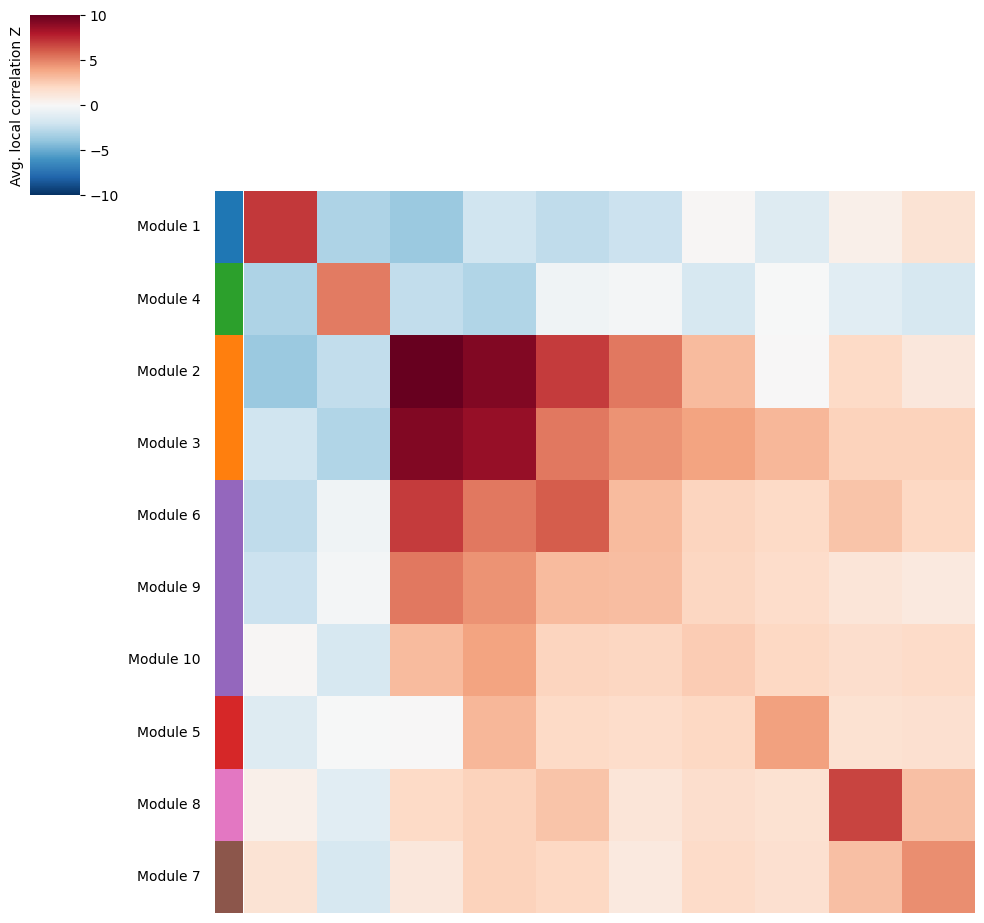

In [17]:
harreman.pl.average_local_correlation_plot(adata, col_cluster=False, row_cluster=False, show=False, super_module_dict=super_module_dict)
# plt.savefig(os.path.join(PLOTS_PATH, 'avg_local_correlation_plot.svg'))

In [18]:
harreman.hs.calculate_module_scores(adata)

100%|██████████| 10/10 [00:01<00:00,  7.61it/s]


In [19]:
modules = adata.obsm['module_scores'].columns
adata.obs[modules] = adata.obsm['module_scores']

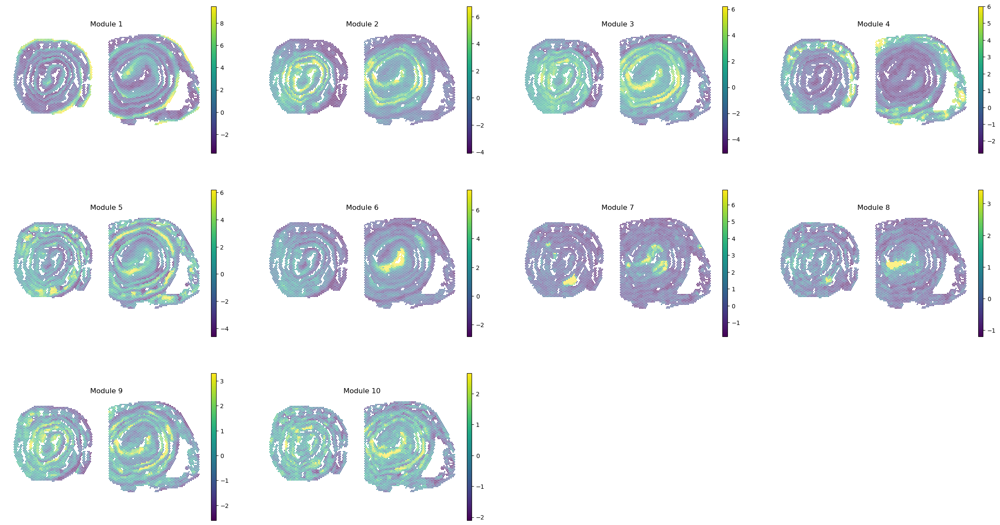

In [20]:
sc.pl.spatial(adata, color=modules, spot_size=80, frameon=False, vmin="p1", vmax="p99", ncols=4, cmap='viridis')

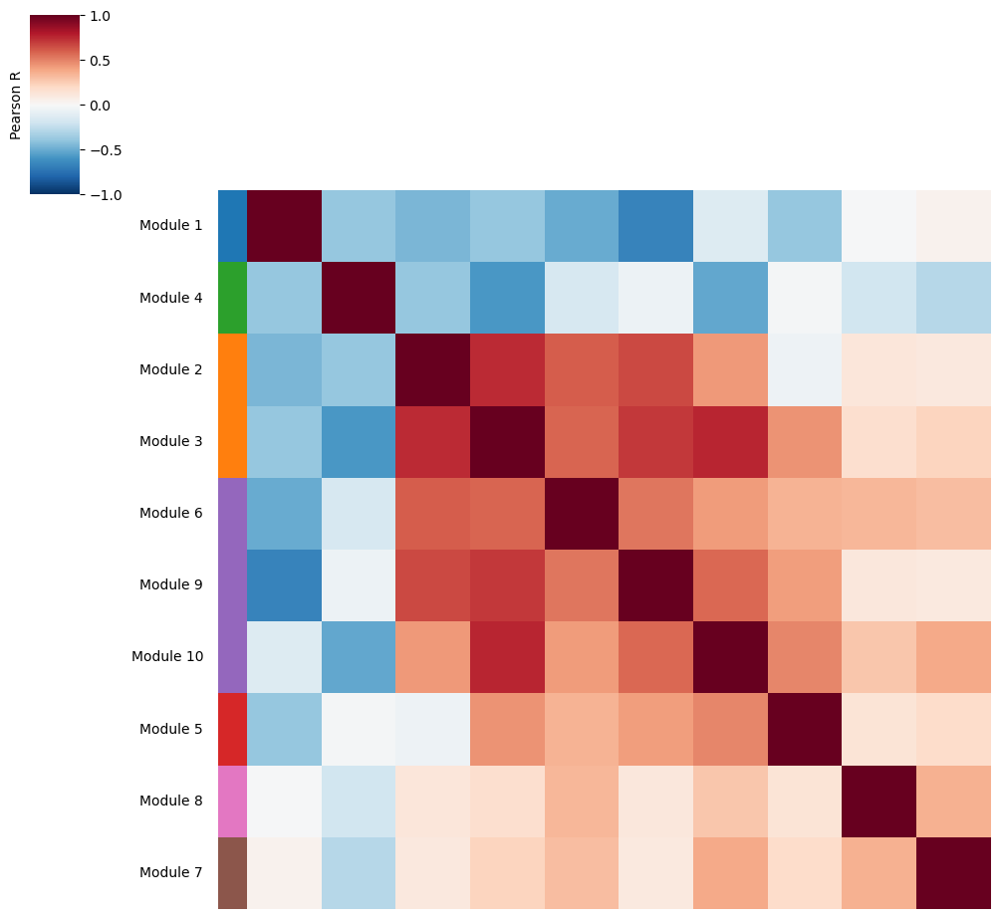

In [21]:
harreman.pl.module_score_correlation_plot(adata, col_cluster=False, row_cluster=False, show=False, super_module_dict=super_module_dict)
# plt.savefig(os.path.join(PLOTS_PATH, 'module_score_correlation_plot.svg'))

In [21]:
# writer=pd.ExcelWriter(os.path.join(DATA_PATH, "Visium_colon_module_gene_list.xlsx"))
# for mod in modules:
#     adata.varm['gene_loadings'][mod].dropna().sort_values(ascending=False).to_excel(writer,sheet_name=mod)
# writer.close()

As one of the additional functions of Harreman, modules can be grouped together into super-modules and recompute the scores using the same approach as in the original Hotspot algorithm.

We assign each module to a cell.

In [22]:
super_module_dict = {
    1: [1],
    2: [2, 3],
    3: [4],
    4: [5],
    5: [6, 9, 10],
    6: [7],
    7: [8],
}

In [23]:
harreman.hs.calculate_super_module_scores(adata, super_module_dict=super_module_dict)

 86%|████████▌ | 6/7 [00:01<00:00,  5.95it/s]

100%|██████████| 7/7 [00:01<00:00,  6.25it/s]

Finished computing super-module scores in 1.129 seconds


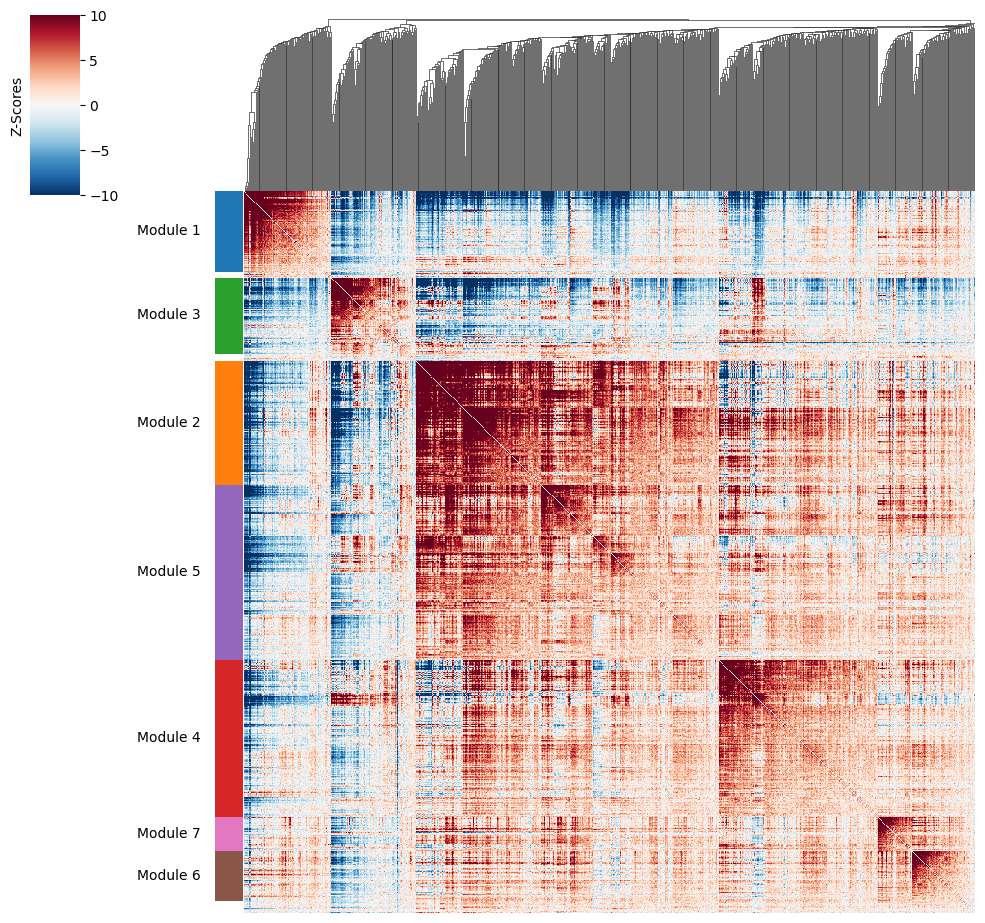

In [24]:
harreman.pl.local_correlation_plot(adata, use_super_modules=True, show=False)
# plt.savefig(os.path.join(PLOTS_PATH, 'local_correlation_plot_sm.svg'))

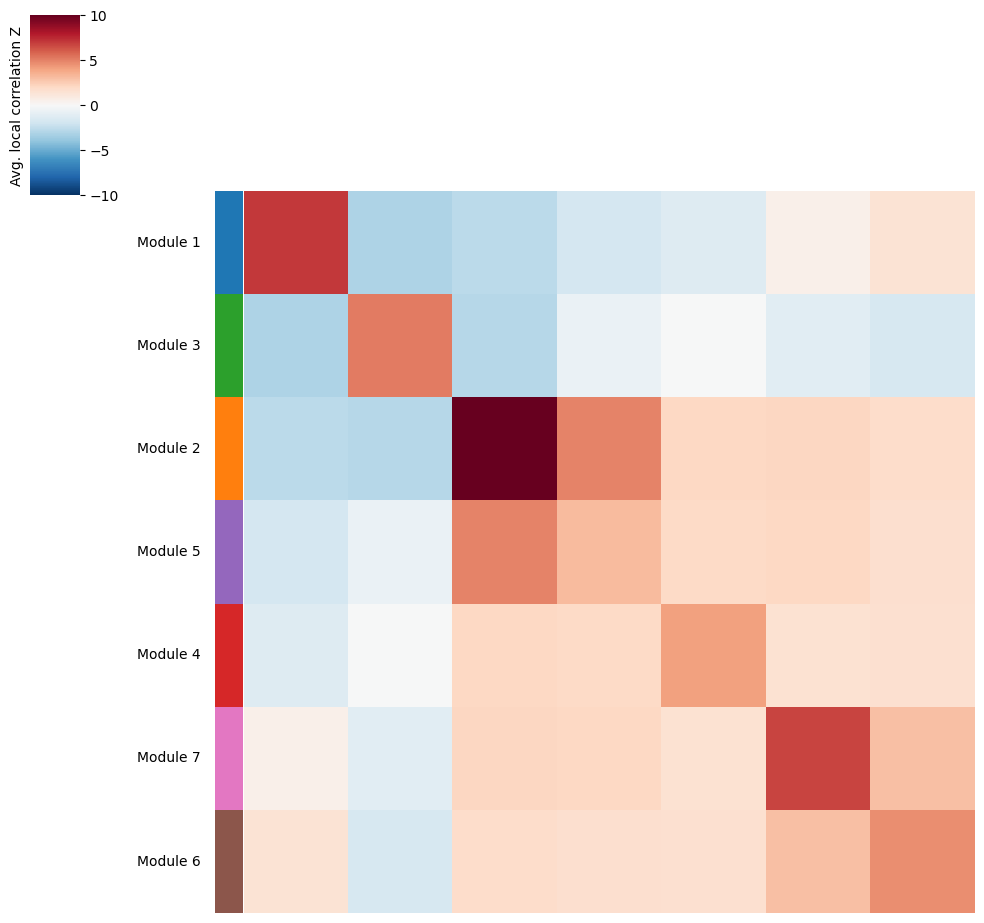

In [25]:
harreman.pl.average_local_correlation_plot(adata, col_cluster=False, row_cluster=False, show=False, use_super_modules=True)
# plt.savefig(os.path.join(PLOTS_PATH, 'avg_local_correlation_plot_sm.svg'))

In [26]:
super_modules = adata.obsm['super_module_scores'].columns
adata.obs[super_modules] = adata.obsm['super_module_scores']

[<Axes: title={'center': 'Module 1'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 2'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 3'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 4'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 5'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 6'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 7'}, xlabel='spatial1', ylabel='spatial2'>]

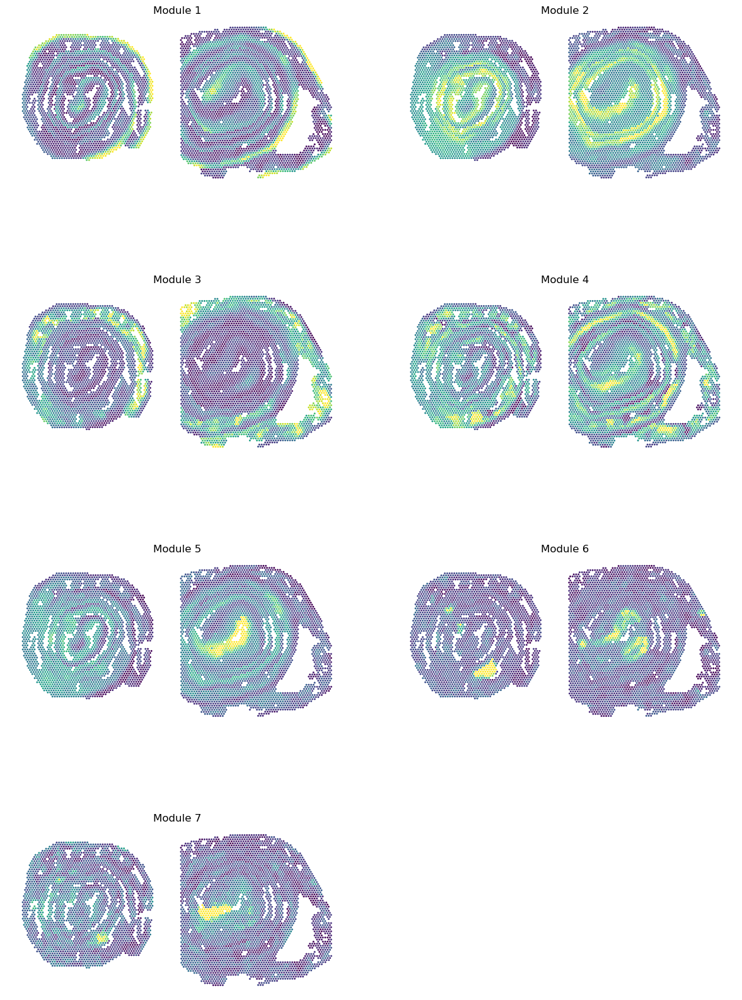

In [27]:
sc.pl.spatial(adata, color=super_modules, spot_size=80, frameon=False, vmin="p1", vmax="p99", ncols=2, cmap='viridis', colorbar_loc=None, show=False)
# plt.savefig(os.path.join(PLOTS_PATH, 'sm_scores.pdf'))

In [20]:
# writer=pd.ExcelWriter(os.path.join(DATA_PATH, "Visium_colon_super_module_gene_list.xlsx"))
# for mod in super_modules:
#     adata.varm['gene_loadings_sm'][mod].dropna().sort_values(ascending=False).to_excel(writer,sheet_name=mod)
# writer.close()

In [28]:
for mod in super_modules:
    print(f'{mod}:')
    mod_genes = adata.varm['gene_loadings_sm'][mod].dropna().sort_values(ascending=False)[:100].index
    print(', '.join(mod_genes))
    print('\n')

Module 1:
mt-Nd2, Ckb, mt-Nd4, mt-Nd3, mt-Cytb, mt-Nd1, Atp2b4, Ckm, Slc25a4, Slc24a3, mt-Co2, mt-Co3, Aoc3, Atp1a2, Slc2a4, mt-Nd5, Chst12, Ptgis, Pde5a, Ldhb, Pygb, Mgll, B3galnt1, Adcy5, Slco3a1, Dpysl3, Pde3a, Ak1, Inpp5a, mt-Nd4l, Ass1, Slc8a2, Nos1, Plcl1, Eno2, Aldh1a2, Slc4a3, Pde1a, Pygm, Plcb4, Slc18a2, Itpkb, St3gal2, Ptgs1, Gaa, Entpd3, Enpp1, Fads1, Dpysl2, Slc5a7, Man2a2, Ids, Inpp4a, Chpf, Plcb1, Slc38a1, B4galt2, Car14, Hs3st2, Pdxp, Pik3ca, Slc18a3, Ddo, Atp1b2, Slc29a1, Slc2a12, Acadsb, B4gat1, Dbh, Atp10a, Adcy3, Gmpr, Cds2, Gbe1, Slc7a8, P4ha1, Ache, Comt, Asrgl1, Slc25a12, Plce1, Maob, Sgpp1, Ptgs2, Gcnt2


Module 2:
B3gnt7, Adh1, Ckmt1, Atp1b1, Aldh2, Mgat4a, Nans, Car2, Slc5a8, St6galnac6, Ggh, St3gal6, Aldh1l1, Hexb, B3galt5, Slc26a2, Hsd11b2, B3gnt5, Ppa1, Slc6a8, Pkm, Gne, Glul, Eno3, Abat, Pde7a, St3gal4, Slc20a1, Cmas, Slc16a1, Pla2g10, Atp1a1, Slc26a3, Uqcr10, Gfpt1, Gpx1, B4galt1, Ddost, Ak3, Oxct1, Slc36a1, Pcx, Acly, Cox7a2, Aldoa, Cox6b1, Mat2a, Slc46a1

In [1]:
module_representative_genes = {
    "Module 1 — Mitochondrial-Energetic Transport": [
        "mt-Nd2", "Ckb", "Slc2a4", "Ptgs2", "Ache"
    ],
    "Module 3 — Hepato-Renal Metabolism & Detoxification": [
        "Hmgcs2", "Slc13a1", "Arg2", "Cat", "Acox1"
    ],
    "Module 2 — Glycolysis and Amino Acid Metabolism": [
        "Gapdh", "Slc6a8", "Glul", "Pkm", "Hk2"
    ],
    "Module 5 — Redox and Mitochondrial Respiration": [
        "Txnrd1", "Ucp2", "Sdha", "Pfkl", "Gls"
    ],
    "Module 4 — Glycosylation & NADH Metabolism": [
        "Gmds", "Tkt", "Fasn", "Idh1", "Galnt3"
    ],
    "Module 7 — Barrier Tissue & Immune Detox": [
        "Arg1", "Slc7a11", "Alox12", "Duox1", "Xdh"
    ],
    "Module 6 — Lipid Signaling & Kinase Regulation": [
        "Plcg2", "Cyp4f18", "Pik3cd", "Pla2g2d", "Man1a"
    ],
}

In [2]:
print('\n'.join([gene for genes in module_representative_genes.values() for gene in genes]))

mt-Nd2
Ckb
Slc2a4
Ptgs2
Ache
Hmgcs2
Slc13a1
Arg2
Cat
Acox1
Gapdh
Slc6a8
Glul
Pkm
Hk2
Txnrd1
Ucp2
Sdha
Pfkl
Gls
Gmds
Tkt
Fasn
Idh1
Galnt3
Arg1
Slc7a11
Alox12
Duox1
Xdh
Plcg2
Cyp4f18
Pik3cd
Pla2g2d
Man1a


Additionally, the dominant module (*use_super_modules=False*) or super-module (*use_super_modules=True*) can be assigned to each cell or spot by using the *compute_top_scoring_modules* function.

With this function, module scores are z-scored and the module with a value higher than the mean + n standard deviations (*sd=1* by default) is assigned to each spot. In case there is more than one module that meet this condition, then the module with the highest z-scored value (across those modules that meet the condition) is selected. If none of the modules meet the condition, then the module with the highest z-scored value (across all modules) is selected. If there are no modules with a higher z-scored value than the average value for a given spot, then none of the modules is assigned to the spot (we assume that the spot is not specific to any module or has low quality).

In [29]:
adata.obs['top_super_module'] = harreman.hs.compute_top_scoring_modules(adata, sd=1, use_super_modules=True)

In [30]:
d0_adata = sc.read_h5ad(os.path.join(ADATA_PATH, 'Visium_colon_d0_adata.h5ad'))
d14_adata = sc.read_h5ad(os.path.join(ADATA_PATH, 'Visium_colon_d14_adata.h5ad'))

In [31]:
d0_adata.obs['top_super_module'] = adata.obs['top_super_module']
d14_adata.obs['top_super_module'] = adata.obs['top_super_module']

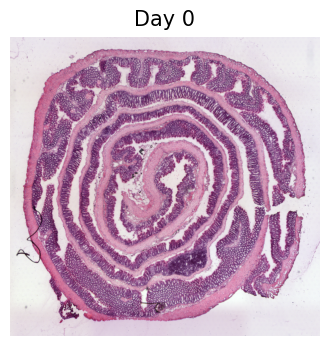

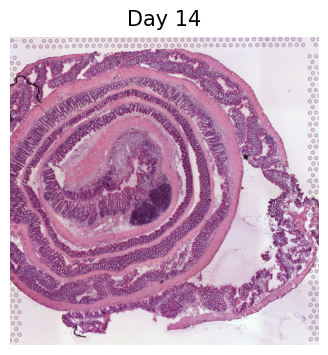

In [63]:
for ad_ in [d0_adata, d14_adata]:
    with mplscience.style_context():
        cond = ad_.obs['cond'].unique()[0]
        sc.pl.spatial(ad_, frameon=False, title=cond, show=False, img_key='hires')
        # plt.savefig(os.path.join(PLOTS_PATH, f"{cond.replace(' ', '_')}_HE_image.pdf"))

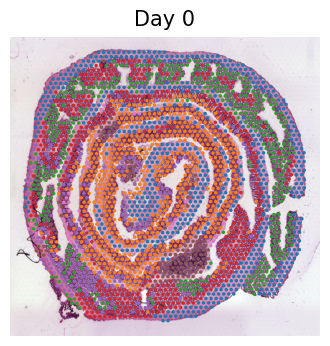

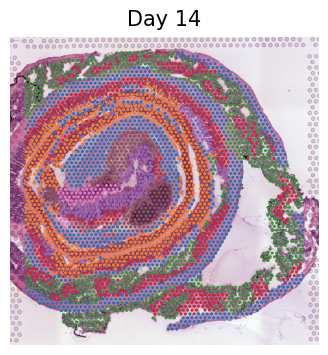

In [32]:
for ad_ in [d0_adata, d14_adata]:
    with mplscience.style_context():
        cond = ad_.obs['cond'].cat.categories[0]
        sc.pl.spatial(ad_, color='top_super_module', frameon=False, spot_size=70, img_key="hires", legend_loc=None, title=cond, show=False)
        # plt.savefig(os.path.join(PLOTS_PATH, f"{cond.replace(' ', '_')}_top_super_module_HE_image.pdf"))

## Polynomial regression of the module scores across the proximal-distal axis

In [3]:
adata = harreman.read_h5ad(os.path.join(ADATA_PATH, 'Visium_colon_Metabolic_Hotspot_unrolled.h5ad'))

In [4]:
fraction_data = adata.obs.groupby(['cond', 'top_super_module'])['cond'].count()

In [5]:
fraction_data = fraction_data.rename("n")
fraction_df = fraction_data.reset_index()
fraction_df["Fraction"] = fraction_data.groupby(level=0).apply(lambda x: x / float(x.sum())).values
fraction_df = fraction_df[fraction_df.n != 0]

In [6]:
fraction_df['cond'] = fraction_df['cond'].cat.reorder_categories(['Day 14', 'Day 0'])

In [7]:
conditions = adata.obs['cond'].cat.categories

In [8]:
from_cond_to_name = {
    'Day 0': 'd0',
    'Day 14': 'd14',
}

In [9]:
super_modules = adata.obsm['super_module_scores'].columns

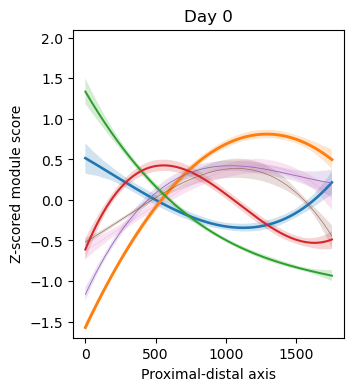

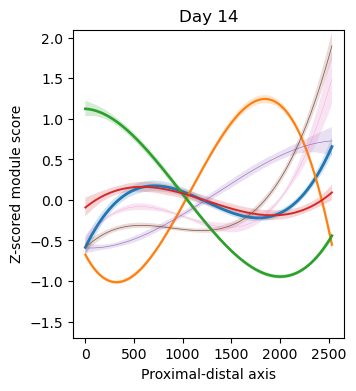

In [10]:
for cond in conditions:
    cond_adata = adata[adata.obs['cond'] == cond].copy()
    polynomial_regression(adata=cond_adata, cond=cond, super_modules=super_modules, fraction_df=fraction_df, var='ord', degree = 3, figsize=(3.5,4), xlabel='Proximal-distal axis', y_min=-1.7, y_max=2.1)
    # plt.savefig(os.path.join(PLOTS_PATH, f'prox_dist_polynomial_regression_{from_cond_to_name[cond]}_plot.svg'), bbox_inches='tight')
    plt.show()
    plt.close()

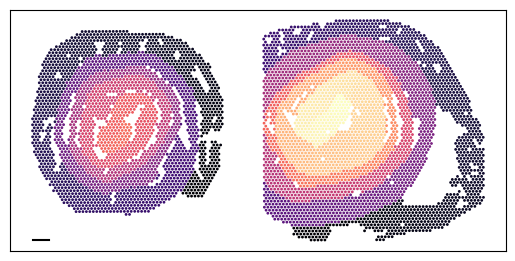

In [39]:
ax = plt.subplot(111)
ax.set_aspect('equal', adjustable='box')

distance = 500

ax.yaxis.set_ticks_position("left")
ax.xaxis.set_ticks_position("bottom")
plt.xticks([])
plt.yticks([])

x_start, y_start = min(adata.obsm['spatial'][:, 0]), max(adata.obsm['spatial'][:, 1])
x_end, y_end = x_start + distance, y_start

plt.scatter(
    adata.obsm['spatial'][:, 0],
    -adata.obsm['spatial'][:, 1],
    alpha=1,
    s=1,
    c=adata.obs['ord'],
    cmap='magma',
)

ax.plot([x_start, x_end], [-y_start, -y_end], color='black')

# plt.savefig(os.path.join(PLOTS_PATH, 'prox_dist_spatial_scatter_plot.svg'), bbox_inches='tight')
plt.show()
plt.close()

## Polynomial regression of the module scores across the serosa-luminal axis

In [15]:
n_bins = 100
adata.obs['dist_norm'] = np.nan
for cond in conditions:
    cond_adata = adata[adata.obs['cond'] == cond].copy()
    cond_adata.obs['ord_bin'] = pd.cut(cond_adata.obs['ord'], bins=n_bins, labels=False)
    y_min_global = cond_adata.obs['dist'].min()
    y_max_global = cond_adata.obs['dist'].max()
    def dist_normalization(y):
        y_max = y.max()
        y_min = y.min()
        return y_min_global + (((y - y_min) / (y_max - y_min)) * (y_max_global / 2))
    cond_adata.obs['dist_norm'] = cond_adata.obs.groupby('ord_bin')['dist'].transform(dist_normalization)
    adata.obs['dist_norm'][adata.obs['cond'] == cond] = cond_adata.obs['dist_norm']

In [16]:
conditions = adata.obs['cond'].cat.categories

In [17]:
from_cond_to_name = {
    'Day 0': 'd0',
    'Day 14': 'd14',
}

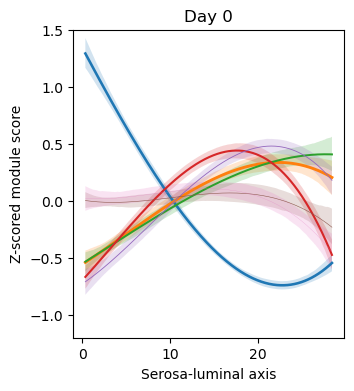

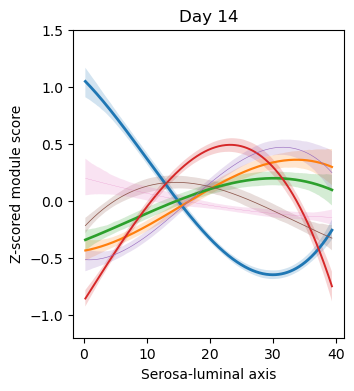

In [18]:
for cond in conditions:
    cond_adata = adata[adata.obs['cond'] == cond].copy()
    polynomial_regression(adata=cond_adata, cond=cond, super_modules=super_modules, fraction_df=fraction_df, var='dist_norm', degree = 3, figsize=(3.5,4), xlabel='Serosa-luminal axis', y_min=-1.2, y_max=1.5)
    # plt.savefig(os.path.join(PLOTS_PATH, f'ser_lum_polynomial_regression_{from_cond_to_name[cond]}_plot.svg'), bbox_inches='tight')
    plt.show()
    plt.close()

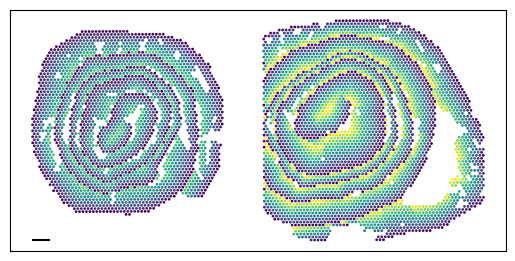

In [44]:
ax = plt.subplot(111)
ax.set_aspect('equal', adjustable='box')

distance = 500

ax.yaxis.set_ticks_position("left")
ax.xaxis.set_ticks_position("bottom")
plt.xticks([])
plt.yticks([])

x_start, y_start = min(adata.obsm['spatial'][:, 0]), max(adata.obsm['spatial'][:, 1])
x_end, y_end = x_start + distance, y_start

plt.scatter(
    adata.obsm['spatial'][:, 0],
    -adata.obsm['spatial'][:, 1],
    alpha=1,
    s=1,
    c=adata.obs['dist_norm'],
    cmap='viridis',
)

ax.plot([x_start, x_end], [-y_start, -y_end], color='black')

# plt.savefig(os.path.join(PLOTS_PATH, 'ser_lum__spatial_scatter_plot.svg'), bbox_inches='tight')
plt.show()
plt.close()

## Violin plot of the module scores across conditions and regions

In [45]:
df = adata.obs[['cond', 'top_super_module']].dropna().copy()

In [46]:
df['module_score'] = df.index.map(lambda x: adata.obsm['module_scores'].loc[x, df['top_super_module'].loc[x]])

In [47]:
palette = {
    'Day 0': '#ffbb78',
    'Day 14': '#c5b0d5',
}

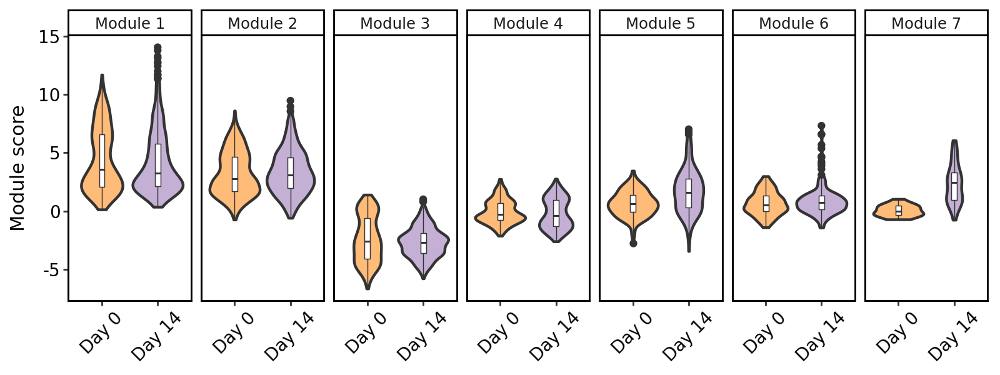

In [48]:
fig = (
ggplot(data=df, mapping=aes(x='cond', y='module_score', fill='cond')) 
+ geom_violin(size=0.9)
+ geom_boxplot(width=0.1, fill='white', size=0.3)
+ facet_grid(cols='top_super_module')
+ scale_fill_manual(values=palette)
# + xlab('')
+ ylab('Module score')
+ theme_classic() 
+ theme(plot_title = element_text(hjust = 0.5,
                                margin={"t": 0, "b": 5, "l": 0, "r": 0},
                                size = 14,
                                face='bold'),
        legend_position = "none",
        axis_title_x = element_blank(),
        axis_title_y = element_text(size = 11),
        axis_text_x = element_text(margin={"t": 0, "b": 0, "l": 0, "r": 10}, size = 10, colour='black', rotation=45),
        axis_text_y = element_text(margin={"t": 0, "b": 0, "l": 0, "r": 10}, size = 10, colour='black'),
        panel_border = element_rect(color='black'),
        panel_background = element_rect(colour = "black",
                                        linewidth = 1),
        figure_size=(8, 3))
)
fig.show()
# fig.save(os.path.join(PLOTS_PATH, 'sm_score_violin_plot.svg'), format='svg')

In [49]:
p_values = []
modules = []

for module, group in df.groupby('top_super_module'):
    scores_1 = group.loc[group['cond'] == 'Day 0', 'module_score']
    scores_2 = group.loc[group['cond'] == 'Day 14', 'module_score']
    
    if len(scores_1) > 1 and len(scores_2) > 1:
        stat, p = mannwhitneyu(scores_1, scores_2, alternative='two-sided')
        p_values.append(p)
        modules.append(module)

adjusted_p = multipletests(p_values, method='fdr_bh')[1]
results_df = pd.DataFrame({'module': modules, 'p_value': p_values, 'adjusted_p_value': adjusted_p})

In [50]:
results_df

,module,p_value,adjusted_p_value
0,Module 1,7.983021e-02,1.357680e-01
1,Module 2,1.213377e-01,1.415606e-01
2,Module 3,9.697715e-02,1.357680e-01
3,Module 4,1.458591e-02,3.403379e-02
4,Module 5,1.224215e-09,4.284752e-09
5,Module 6,3.033400e-01,3.033400e-01
6,Module 7,4.685895e-14,3.280127e-13


We finally save the output.

In [51]:
# harreman.write_h5ad(adata, os.path.join(ADATA_PATH, 'Visium_colon_Metabolic_Hotspot_unrolled.h5ad'))

## Cell type proportions

In [3]:
st_adata = sc.read_h5ad(VISIUM_COLON_DESTVI_ADATA_PATH)

In [53]:
ct_list = st_adata.obsm["proportions"].columns

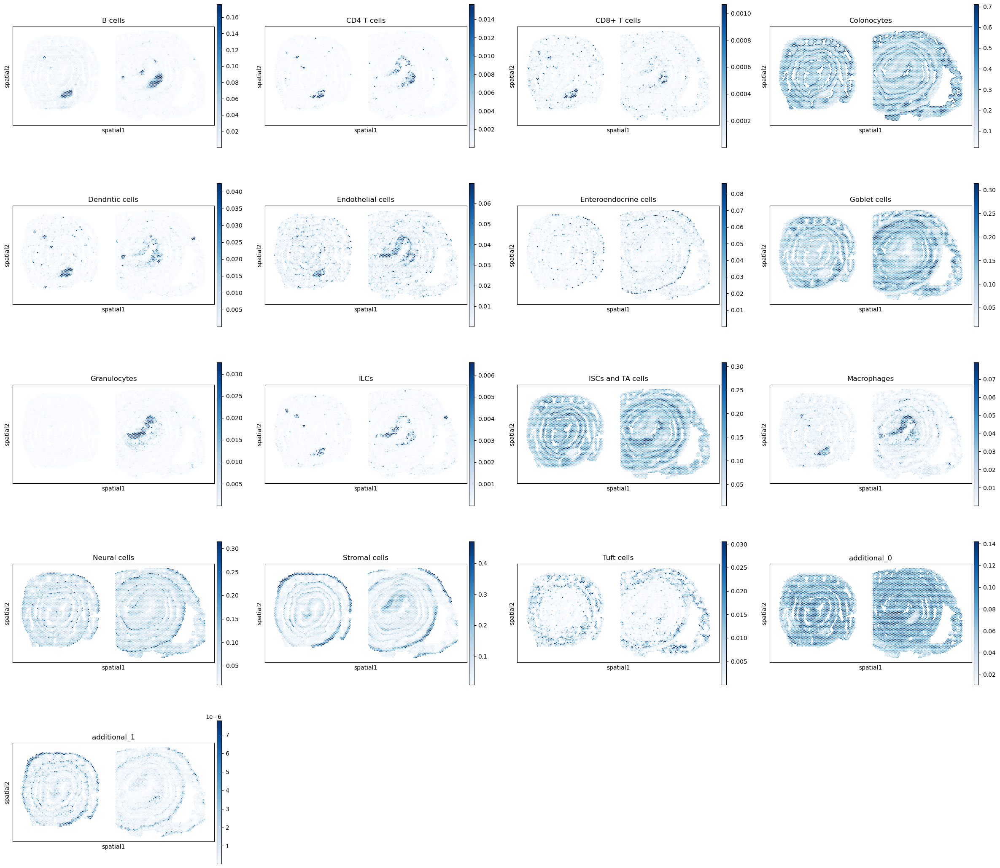

In [54]:
sc.pl.spatial(st_adata, color=ct_list, spot_size=80, cmap="Blues", vmin='p0', vmax='p99', ncols=4)

### Relative abundance of cell types per module

In [4]:
adata = harreman.read_h5ad(os.path.join(ADATA_PATH, 'Visium_colon_Metabolic_Hotspot_unrolled.h5ad'))

In [4]:
proportions_df = st_adata.obsm["proportions"].copy()
cell_types = [ct for ct in proportions_df.columns if 'additional' not in ct]
proportions_df = zscore(proportions_df[cell_types]).copy()

In [5]:
proportions_df = pd.concat([proportions_df, adata.obs[['cond', 'top_super_module']]], axis=1).dropna()

In [15]:
proportions_df_long = proportions_df.melt(
    id_vars=["cond", "top_super_module"], 
    var_name="cell_type", 
    value_name="abundance"
)

In [17]:
summary = (
    proportions_df_long
    .groupby(["cond", "top_super_module", "cell_type"])
    .agg(
        mean_abundance=("abundance", "mean"),
        std_abundance=("abundance", "std"),
        n=("abundance", "count")
    )
    .reset_index()
)

summary["se_abundance"] = summary["std_abundance"] / summary["n"]**0.5

summary["ymin"] = summary["mean_abundance"] - summary["se_abundance"]
summary["ymax"] = summary["mean_abundance"] + summary["se_abundance"]

In [21]:
palette = {'B cells': '#DEEBF7',
 'CD4 T cells': '#C6DBEF',
 'CD8+ T cells': '#9ECAE1',
 'ILCs': '#6BAED6',
 'Dendritic cells': '#4292C6',
 'Macrophages': '#2171B5',
 'Granulocytes': '#08519C',
 'ISCs and TA cells': '#C7E9C0',
 'Colonocytes': '#A1D99B',
 'Goblet cells': '#74C476',
 'Enteroendocrine cells': '#41AB5D',
 'Tuft cells': '#238B45',
 'Endothelial cells': '#FCAE91',
 'Stromal cells': '#FB6A4A',
 'Neural cells': '#DE2D26'}

In [22]:
summary['cell_type'] = summary['cell_type'].astype('category')
summary['cell_type'] = summary['cell_type'].cat.reorder_categories(list(palette.keys()))

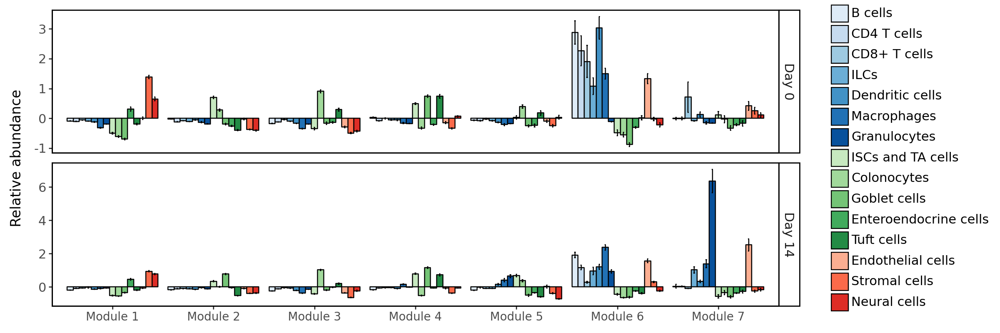

In [24]:
fig = (ggplot()
        + geom_col(data=summary, 
                      mapping=aes(x='top_super_module', y='mean_abundance', fill='cell_type'), 
                      stat='identity', position=position_dodge(width=0.9), color='black')
        + geom_errorbar(
                data=summary,
                mapping=aes(x='top_super_module', ymin='ymin', ymax='ymax', group='cell_type'),
                position=position_dodge(width=0.9),
                width=0.2
        )
        + facet_grid(rows='cond', scales='free_y')
        + scale_fill_manual(values=palette)
        + theme_classic()
        + theme(plot_title = element_text(hjust = 0.5,
                                margin={"t": 0, "b": 0, "l": 10, "r": 0},
                                size = 9),
        legend_title = element_blank(),
        legend_text = element_text(size = 11),
        strip_text = element_text(size = 11),
        axis_title_x = element_blank(),
        axis_title_y = element_text(size = 12),
        axis_text_x = element_text(size = 10, rotation=0),
        axis_text_y = element_text(margin={"t": 0, "b": 0, "l": 0, "r": 10}, size = 11),
        panel_grid_major = element_blank(),
        panel_grid_minor = element_blank(),
        panel_border = element_rect(color='black'),
        panel_background = element_rect(colour = "black",
                                        linewidth = 1),
        figure_size=(12, 4)) 
        + labs(x="", y="Relative abundance"))

fig.show()
# fig.save(os.path.join(PLOTS_PATH, 'sm_ct_rel_abundance_bar_plot.svg'))